In [1]:
import matplotlib.pyplot as plt, mpld3
import numpy as np
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
%matplotlib widget
import scipy.interpolate as ip
from mpld3 import plugins
import seaborn as sns
sns.set(style='ticks', palette='Set2')
import csv
import json
import matplotlib
import pandas as pd
plt.rcParams['text.usetex'] = True
#plt.rcParams['pgf.texsystem']='xelatex'
#plt.rcParams['font.family']='Nimbus Sans'
plt.rcParams['font.family'] = 'sans-serif'
#plt.rcParams['mathtext.fontset'] = 'custom'
#plt.rcParams['mathtext.default'] = 'it'
import csv
import json
import copy
from tqdm.notebook import tqdm
markers = ['x','o','^','v','+','s','*','D']
ordinal = lambda a: {1:'1st', 2:'2nd', 3:'3rd',4:'4th',5:'5th', 11:'th', 12:'th', 13:'th' }[a]
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset

In [2]:
def transfer_function(int_dicts, order):
    int_dicts_copy = copy.deepcopy(int_dicts)
    for row in int_dicts_copy[order]: row['OE0'] = 50000
    repacked_values = {f"OE{i}":np.array([value[f'OE{i}'] for value in int_dicts_copy[order]]) for i in range(0,10)}
    ratios = {f"OE{i+1}/OE{i}": repacked_values[f"OE{i+1}"]/repacked_values[f"OE{i}"] for i in range(0, 9)}
    return ratios

In [3]:
def plot_ratios(fluxes, ratio_dict, order):
    fig,ax = plt.subplots()
    for label, marker in zip(ratio_dict[order].keys(), markers):
        ax.plot(fluxes[order].to_numpy()[:,0]/order, ratio_dict[order][label], label=label, markersize=3, marker=marker)
    ax.legend(bbox_to_anchor=(1, 0.5), loc='center')
    ax.set_xlabel("1st Order Energy / eV")
    ax.set_ylabel("Ratio of number of Rays")
    return fig, ax

In [ ]:
def plot_total_signal()

In [4]:
def plot_all(cff, key='Intensity_dict'):
    data = {i:pd.read_csv(f"./cff_scan/cff_{cff}_order_{i}.csv", skiprows=1) for i in range(1,6)}
    fluxes = {i: data[i][['E','Flux']] for i in range(1,6)}
    int_dicts = {}
    
    for order in range(1,6):
        int_list = []
        for row in data[order][key]:
            int_list.append(eval(row))
        int_dicts[order] = int_list

    ratio_dict =  {i: transfer_function(int_dicts, i) for i in range(1,6)}
    
    fig, ax = plt.subplots()
    for i in range(1, 6):
        ax.scatter(fluxes[i]['E']/i, fluxes[i]['Flux'], s=3, marker='x', label=f'{ordinal(i)} order')
    ax.semilogy()
    ax.legend()
    ax.set_xlabel("1st Order Energy / eV")
    ax.set_ylabel("Flux / photons s$^{-1}$")
    ax.set_title(rf"$\mathit{{c_{{ff}}}}=${cff}, 400 l/mm")
    ax.set_ylim(1E5, 1E12)
    ax.set_xticks(np.arange(0,3000,100), minor=True)
    ax.grid(which='both', alpha=0.4)
    plt.tight_layout()
    fig.savefig(f"./cff_scan/plots/{cff}_all_orders.png",dpi=300)

    for order in range(1, 6):
        fig, ax = plot_ratios(fluxes, ratio_dict, order)
        ax.set_title(rf"Transfer Function $c_{{ff}}=${cff} {ordinal(order)} order")
        plt.tight_layout()
        fig.savefig(f"./cff_scan/plots/{cff}_transfer_O{order}.png", dpi=300)


    #Just Fluxes for All orders
    fig, ax = plt.subplots()
    for i in range(1, 6):
        ax.scatter(fluxes[i]['E']/i, fluxes[i]['Flux'], s=3, marker='x',linewidth=3, label=f'{ordinal(i)} order')
    ax.semilogy()
    ax.legend()
    ax.set_xlabel("1st Order Energy / eV")
    ax.set_ylabel("Flux / photons s$^{-1}$")
    ax.set_title(rf"$\mathit{{c_{{ff}}}}=${cff}, 400 l/mm")
    ax.set_ylim(1E8, 1E12)
    ax.set_xlim(300, 2500)
    ax.set_xticks(np.arange(0,3000,100), minor=True)
    ax.grid(which='both', alpha=0.4)
    plt.tight_layout()
    fig.savefig(f"./cff_scan/plots/{cff}_justflux.png", dpi=300)


    #Fluxes for all orders AND total weighted
    fig, ax = plt.subplots()
    interpolates = {i: ip.CubicSpline(fluxes[i]['E']/i, fluxes[i]['Flux']) for i in range(1, 6)}
    for i in range(1, 6):
        ax.scatter(fluxes[i]['E']/i, fluxes[i]['Flux'], s=23, marker=f'${i}$', label=f'{ordinal(i)} order', linewidth=0.1)
        #ax.plot(a[i]['E']/i, interpolates[i](a[i]['E']/i), ls='--', c='gray')
    ax.semilogy()
    detector = np.sum([i * interpolates[i](fluxes[1]['E']) for i in range(2,6)], axis=0)
    detector += fluxes[1]['Flux']
    ax.plot(fluxes[1]['E'], detector, ls='dashdot', label='Total Weighted Flux', lw=2, c='red')
    ax.set_xlabel("1st Order Energy / eV")
    ax.set_ylabel("Flux / photons s$^{-1}$")
    ax.set_title(rf"$\mathit{{c_{{ff}}}}=${cff}, 400 l/mm")
    ax.set_ylim(1E9, 1E12)
    ax.set_xlim(300, 2500)
    ax.set_xticks(np.arange(0,3000,100), minor=True)
    ax.legend()
    
    ax.grid(which='both', alpha=0.4)
    plt.tight_layout()
    
    
    # Different Order Permutation
    fig, ax = plt.subplots()
    for i in range(1, 6):
        ax.scatter(fluxes[i]['E'][::2*i]/i, fluxes[i]['Flux'][::2*i], s=20, marker=f'${i}$', label=f'{ordinal(i)} order', alpha=1, linewidth=0.1)
        #ax.plot(fluxes[i]['E']/i, interpolates[i](fluxes[i]['E']/i), ls='--', c='gray')
    ax.semilogy()
    detector = np.array([i * interpolates[i](fluxes[1]['E']) for i in range(2,6)])
    ax.plot(fluxes[1]['E'], fluxes[1]['Flux'] + detector[0,:], label="Up to 2nd Order", ls='--')
    ax.plot(fluxes[1]['E'], fluxes[1]['Flux'] + detector[0:2,:].sum(axis=0), lw=3, label="Up to 3rd Order", ls='dotted')
    ax.plot(fluxes[1]['E'], fluxes[1]['Flux'] + detector[0:3,:].sum(axis=0), lw=4, label="Up to 4th Order", ls='dotted')
    ax.plot(fluxes[1]['E'], fluxes[1]['Flux'] + detector[0:4,:].sum(axis=0), lw=3, label="Up to 5th Order", ls='dashdot', alpha=0.8)
    ax.set_xlabel("1st Order Energy / eV")
    ax.set_ylabel("Flux / photons s$^{-1}$")
    ax.set_title(rf"$\mathit{{c_{{ff}}}}=${cff}, 400 l/mm")
    ax.set_ylim(1E9, 1E13)
    ax.set_xlim(300, 1500)
    ax.set_xticks(np.arange(0,2500,100), minor=True)
    inset = ax.inset_axes([0.65,0.15, 0.3,0.3])
    for i in range(1, 6):
        inset.scatter(fluxes[i]['E'][::2*i]/i, fluxes[i]['Flux'][::2*i], s=20, marker=f'${i}$', label=f'{ordinal(i)} order', alpha=0.5, linewidth=0.1)
        #ax.plot(fluxes[i]['E']/i, interpolates[i](fluxes[i]['E']/i), ls='--', c='gray')
    inset.semilogy()
    inset.set_ylim(1E9,1E12)
    inset.set_xticks(np.arange(0,3000,100), minor=True)
    inset.set_xticks(np.arange(0,4000,1000))
    inset.set_title("Full Range")
    
    ax.grid(which='both', alpha=0.4)
    ax.legend(ncol=3)
    fig.savefig(f"./cff_scan/plots/{cff}_orderpermute_O{order}.png", dpi=300)
    plt.tight_layout()
    return fluxes, ratio_dict ,data

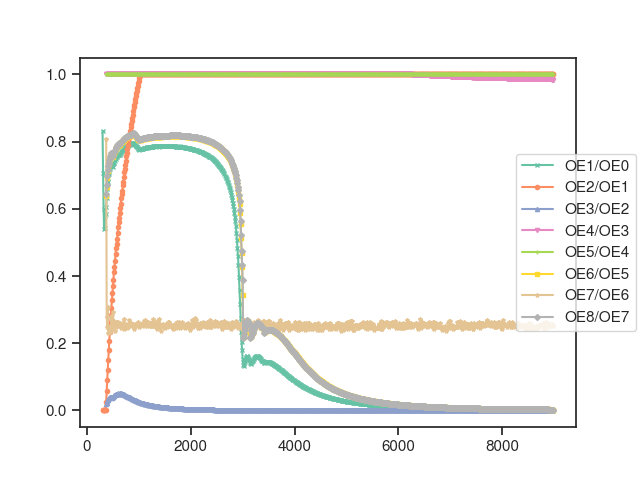

In [242]:
fig,ax = plt.subplots()
for label, marker in zip(b[order].keys(), markers):
    ax.plot(a[order].to_numpy()[:,0], b[order][label], label=label, markersize=3, marker=marker)
ax.legend(bbox_to_anchor=(1, 0.5), loc='center')

In [222]:
b[1]['OE1/OE0']

array([0.83080588, 0.70763983, 0.59846041, 0.54086683, 0.54165506,
       0.57682185, 0.58481444, 0.6051858 , 0.63294319, 0.65983889,
       0.67959397, 0.69276893, 0.70352169, 0.71061915, 0.71820102,
       0.7241044 , 0.72832206, 0.73245141, 0.73253019, 0.72768532,
       0.72488773, 0.73271493, 0.73544064, 0.73735657, 0.74355306,
       0.74941317, 0.75368137, 0.75563227, 0.75836887, 0.76037723,
       0.76112171, 0.76102781, 0.76345038, 0.76183064, 0.76441215,
       0.76722336, 0.7701004 , 0.77172586, 0.77320592, 0.77528415,
       0.77687081, 0.77864475, 0.78080473, 0.78106402, 0.78257829,
       0.78367576, 0.78449214, 0.78599945, 0.78609151, 0.78787539,
       0.78857852, 0.79036206, 0.79069835, 0.79145153, 0.79252313,
       0.79314278, 0.79325677, 0.79497645, 0.79504458, 0.79608973,
       0.79651091, 0.79488578, 0.7926366 , 0.78987888, 0.78834622,
       0.7864694 , 0.78526188, 0.78291872, 0.77969491, 0.77850647,
       0.77620546, 0.77710341, 0.77723024, 0.7778989 , 0.77821

In [250]:
a[1]

,E,Flux
0,300,3.029455e+10
1,310,8.852529e+09
2,320,3.607077e+09
3,330,2.495271e+09
4,340,3.332483e+09
...,...,...
265,2950,1.244052e+08
266,2960,7.561654e+07
267,2970,4.241726e+07
268,2980,2.334390e+07


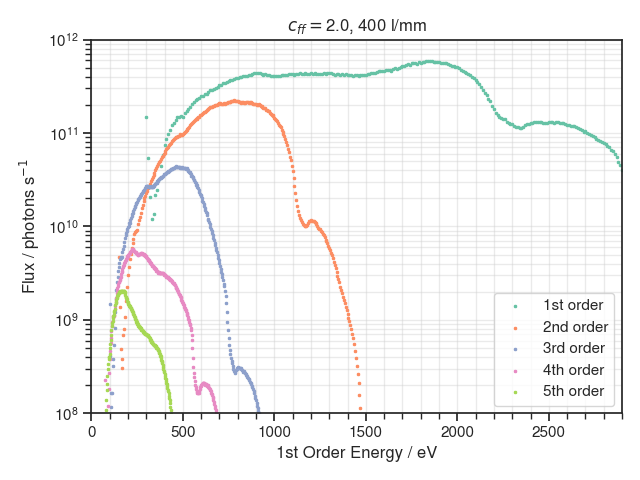

In [372]:
fig, ax = plt.subplots()
for i in range(1, 6):
    ax.scatter(a[i]['E']/i, a[i]['Flux'], s=3, marker='x', label=f'{ordinal(i)} order')
ax.semilogy()
ax.legend()
ax.set_xlabel("1st Order Energy / eV")
ax.set_ylabel("Flux / photons s$^{-1}$")
ax.set_title(rf"$c_{{ff}}=${2.0}, 400 l/mm")
ax.set_ylim(1E8, 1E12)
ax.set_xlim(300, 2500)
ax.set_xticks(np.arange(0,3000,100), minor=True)
ax.grid(which='both', alpha=0.4)
plt.tight_layout()

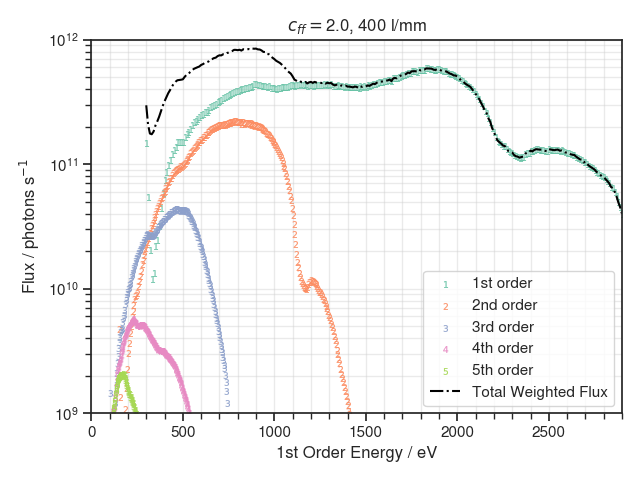

In [366]:
fig, ax = plt.subplots()
interpolates = {i: ip.CubicSpline(a[i]['E']/i, a[i]['Flux']) for i in range(1, 6)}
for i in range(1, 6):
    ax.scatter(a[i]['E']/i, a[i]['Flux'], s=23, marker=f'${i}$', label=f'{ordinal(i)} order', linewidth=0.1)
    #ax.plot(a[i]['E']/i, interpolates[i](a[i]['E']/i), ls='--', c='gray')
ax.semilogy()
detector = np.sum([i * interpolates[i](a[1]['E']) for i in range(2,6)], axis=0)
detector += a[1]['Flux']
ax.plot(a[1]['E'], detector, c='black', ls='dashdot', label='Total Weighted Flux')
ax.set_xlabel("1st Order Energy / eV")
ax.set_ylabel("Flux / photons s$^{-1}$")
ax.set_title(rf"$c_{{ff}}=${2.0}, 400 l/mm")
ax.set_ylim(1E9, 1E12)
ax.set_xlim(300, 2500)
ax.set_xticks(np.arange(0,3000,100), minor=True)
ax.legend()

ax.grid(which='both', alpha=0.4)
plt.tight_layout()

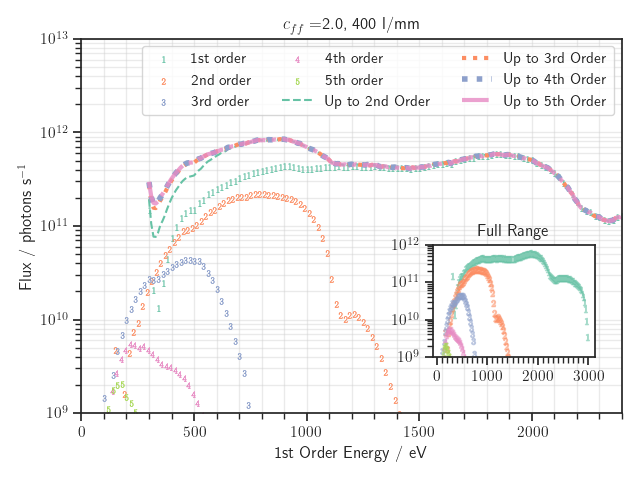

In [410]:
fig, ax = plt.subplots()
interpolates = {i: ip.CubicSpline(a[i]['E']/i, a[i]['Flux']) for i in range(1, 6)}
for i in range(1, 6):
    ax.scatter(a[i]['E'][::2*i]/i, a[i]['Flux'][::2*i], s=20, marker=rf'$\mathrm{{{i}}}$', label=f'{ordinal(i)} order', alpha=1, linewidth=0.3)
    #ax.plot(a[i]['E']/i, interpolates[i](a[i]['E']/i), ls='--', c='gray')
ax.semilogy()
detector = np.array([i * interpolates[i](a[1]['E']) for i in range(2,6)])
ax.plot(a[1]['E'], a[1]['Flux'] + detector[0,:], label="Up to 2nd Order", ls='--')
ax.plot(a[1]['E'], a[1]['Flux'] + detector[0:2,:].sum(axis=0), lw=3, label="Up to 3rd Order", ls='dotted')
ax.plot(a[1]['E'], a[1]['Flux'] + detector[0:3,:].sum(axis=0), lw=4, label="Up to 4th Order", ls='dotted')
ax.plot(a[1]['E'], a[1]['Flux'] + detector[0:4,:].sum(axis=0), lw=3, label="Up to 5th Order", ls='dashdot', alpha=0.8)
ax.set_xlabel("1st Order Energy / eV")
ax.set_ylabel("Flux / photons s$^{-1}$")
ax.set_title(rf"$c_{{ff}}=${2.0}, 400 l/mm")
ax.set_ylim(1E9, 1E13)
ax.set_xlim(300, 1500)
ax.set_xticks(np.arange(0,2500,100), minor=True)
inset = ax.inset_axes([0.65,0.15, 0.3,0.3])
for i in range(1, 6):
    inset.scatter(a[i]['E'][::2*i]/i, a[i]['Flux'][::2*i], s=20, marker=f'$\mathrm{{{i}}}$', label=f'{ordinal(i)} order', alpha=0.5, linewidth=1)
    #ax.plot(a[i]['E']/i, interpolates[i](a[i]['E']/i), ls='--', c='gray')
inset.semilogy()
inset.set_ylim(1E9,1E12)
inset.set_xticks(np.arange(0,3000,100), minor=True)
inset.set_xticks(np.arange(0,4000,1000))
inset.set_title("Full Range")

ax.grid(which='both', alpha=0.4)
ax.legend(ncol=3)

plt.tight_layout()

In [279]:
detector[0,:]

array([4.55641933e+10, 5.11075399e+10, 5.64327054e+10, 6.43934360e+10,
       7.09377068e+10, 7.95848527e+10, 8.84928810e+10, 9.67533880e+10,
       1.06353129e+11, 1.14816873e+11, 1.22537578e+11, 1.33473158e+11,
       1.43334969e+11, 1.53362196e+11, 1.63256733e+11, 1.74498816e+11,
       1.80781004e+11, 1.82241927e+11, 1.87340281e+11, 1.91330943e+11,
       1.96495968e+11, 2.05354761e+11, 2.16978722e+11, 2.27040671e+11,
       2.43847826e+11, 2.54333671e+11, 2.68581932e+11, 2.80028611e+11,
       2.88847860e+11, 2.98821215e+11, 3.14750438e+11, 3.28460139e+11,
       3.39572363e+11, 3.51891863e+11, 3.59200764e+11, 3.75134524e+11,
       3.80068734e+11, 3.89951675e+11, 3.95867612e+11, 4.07857751e+11,
       4.10922995e+11, 4.10162582e+11, 4.13490572e+11, 4.10797703e+11,
       4.23743871e+11, 4.29194600e+11, 4.32865086e+11, 4.37656798e+11,
       4.45613444e+11, 4.41457284e+11, 4.36928342e+11, 4.33895997e+11,
       4.16144462e+11, 4.32093268e+11, 4.23889868e+11, 4.24537441e+11,
      

  0%|          | 0/10 [00:00<?, ?it/s]

/tmp/ipykernel_45236/3700486610.py:5: RuntimeWarning: invalid value encountered in true_divide
  ratios = {f"OE{i+1}/OE{i}": repacked_values[f"OE{i+1}"]/repacked_values[f"OE{i}"] for i in range(0, 9)}
/tmp/ipykernel_45236/1292897585.py:104: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
/tmp/ipykernel_45236/3700486610.py:5: RuntimeWarning: invalid value encountered in true_divide
  ratios = {f"OE{i+1}/OE{i}": repacked_values[f"OE{i+1}"]/repacked_values[f"OE{i}"] for i in range(0, 9)}
/tmp/ipykernel_45236/1292897585.py:104: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
/tmp/ipykernel_45236/3700486610.py:5: RuntimeWarning: invalid value encountered in true_divide
  ratios = {f"OE{i+1}/OE{i}": repacked_values[f"OE{i+1}"]/repacked_values[f"OE{i}"] for i in range(0, 9)}
/tmp/ipykerne

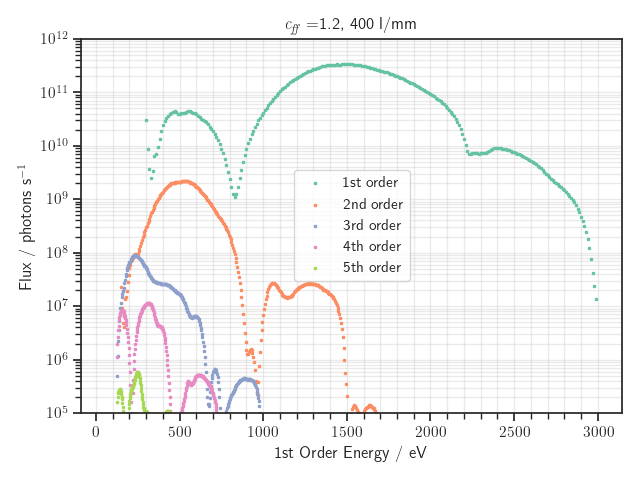

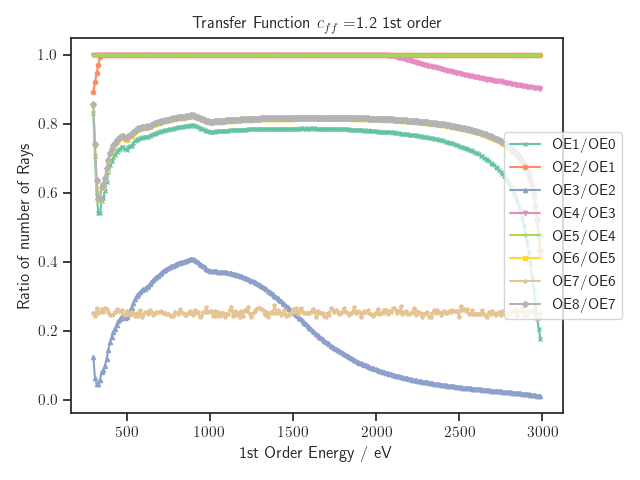

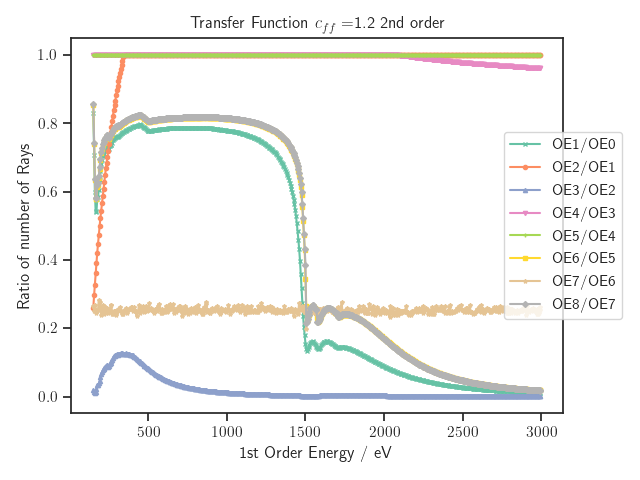

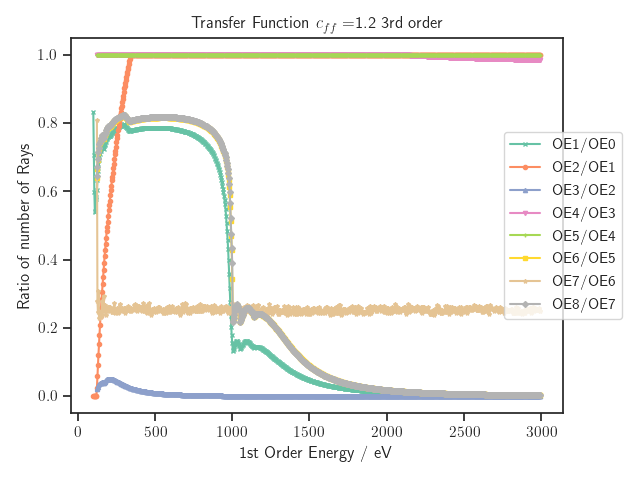

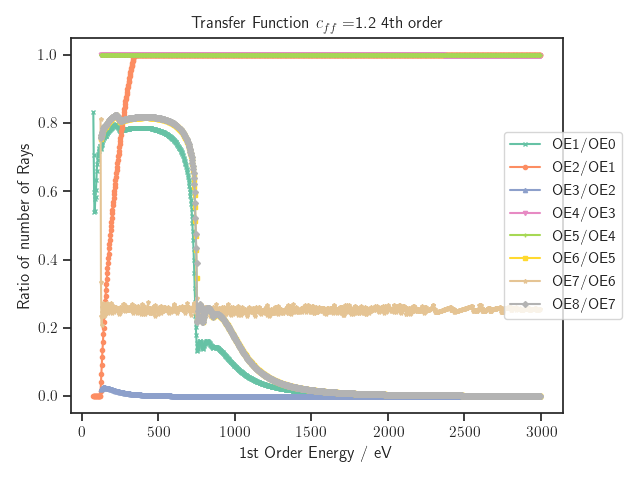

...

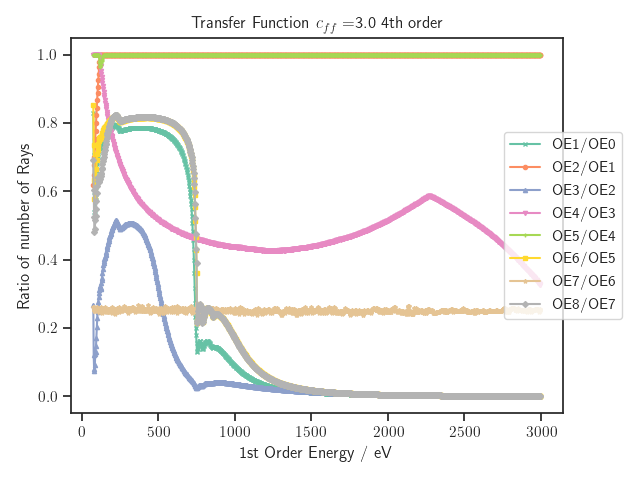

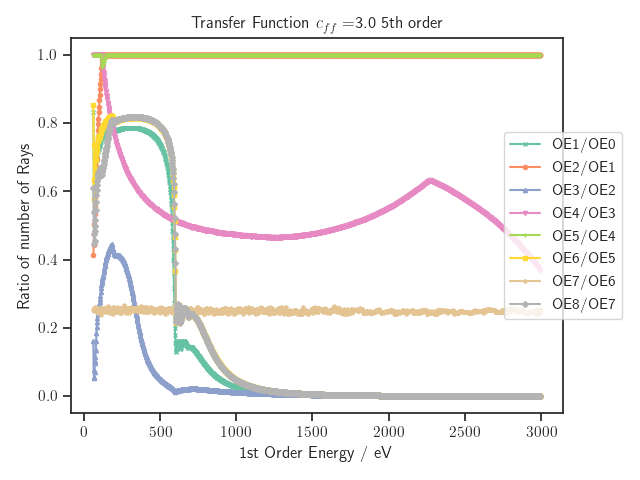

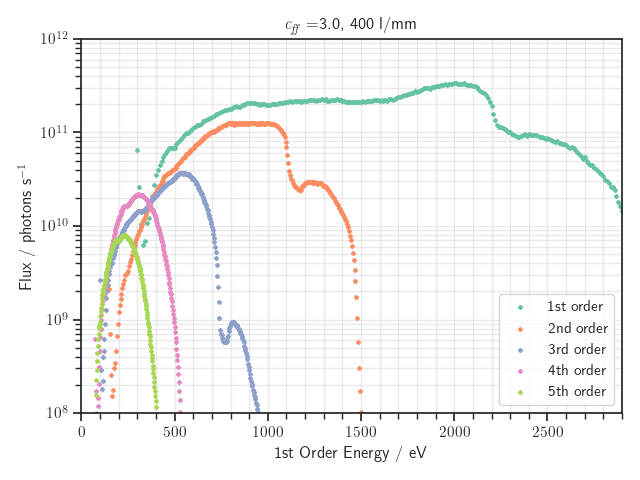

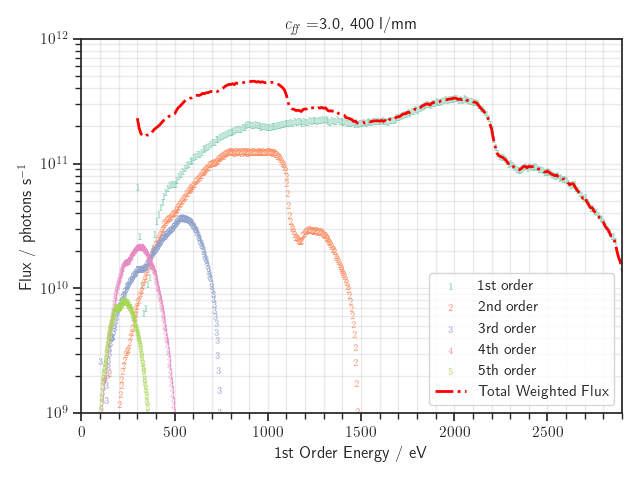

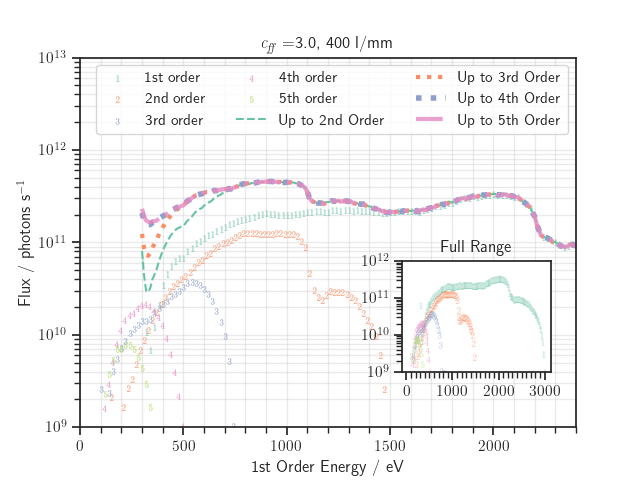

In [29]:
for i in tqdm(np.linspace(1.2, 3, 10)):
    plot_all(round(i,1))

In [20]:
round(2.1000000009, 1)

2.1

In [28]:
np.linspace(1.2, 3, 10)

array([1.2, 1.4, 1.6, 1.8, 2. , 2.2, 2.4, 2.6, 2.8, 3. ])

ValueError: setting an array element with a sequence.

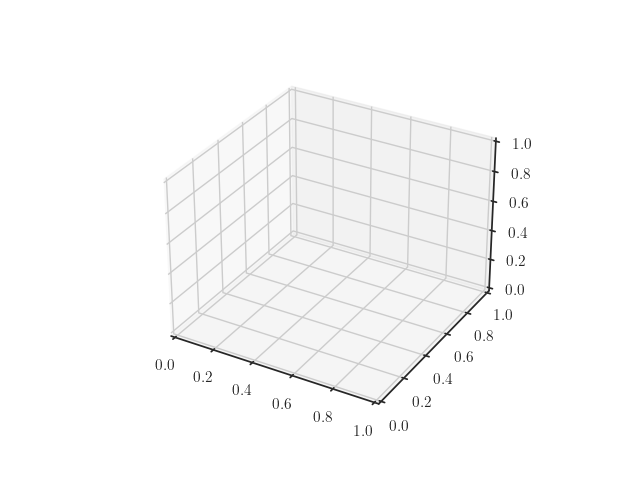

In [38]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(z[:,0], z[:,1], z[:,2])


In [55]:
def calc_surf(cff):
    data = {i:pd.read_csv(f"./cff_scan/cff_{cff}_order_{i}.csv", skiprows=1) for i in range(1,6)}
    fluxes = {i: data[i][['E','Flux']] for i in range(1,6)}
    interpolates = {i: ip.CubicSpline(fluxes[i]['E']/i, fluxes[i]['Flux']) for i in range(1, 6)}
    detector = np.array([i * interpolates[i](fluxes[1]['E']) for i in range(2,6)])
    return  fluxes[1].to_numpy()[:,0], detector.sum(axis=0) / fluxes[1].to_numpy()[:,1]

In [56]:
z = np.array([calc_surf(round(cff,1)) for cff in np.linspace(1.2,3,10)])

In [62]:
z[0,0]

array([ 300.,  310.,  320.,  330.,  340.,  350.,  360.,  370.,  380.,
        390.,  400.,  410.,  420.,  430.,  440.,  450.,  460.,  470.,
        480.,  490.,  500.,  510.,  520.,  530.,  540.,  550.,  560.,
        570.,  580.,  590.,  600.,  610.,  620.,  630.,  640.,  650.,
        660.,  670.,  680.,  690.,  700.,  710.,  720.,  730.,  740.,
        750.,  760.,  770.,  780.,  790.,  800.,  810.,  820.,  830.,
        840.,  850.,  860.,  870.,  880.,  890.,  900.,  910.,  920.,
        930.,  940.,  950.,  960.,  970.,  980.,  990., 1000., 1010.,
       1020., 1030., 1040., 1050., 1060., 1070., 1080., 1090., 1100.,
       1110., 1120., 1130., 1140., 1150., 1160., 1170., 1180., 1190.,
       1200., 1210., 1220., 1230., 1240., 1250., 1260., 1270., 1280.,
       1290., 1300., 1310., 1320., 1330., 1340., 1350., 1360., 1370.,
       1380., 1390., 1400., 1410., 1420., 1430., 1440., 1450., 1460.,
       1470., 1480., 1490., 1500., 1510., 1520., 1530., 1540., 1550.,
       1560., 1570.,